# Formalia:

Please read the [assignment overview page](https://github.com/suneman/socialgraphs2020/wiki/Assignments) carefully before proceeding. This page contains information about formatting (including formats etc), group sizes, and many other aspects of handing in the assignment. 

*If you fail to follow these simple instructions, it will negatively impact your grade!*

**Due date and time**: The assignment is due on Tuesday November 3rd at 23:55. Hand in your IPython notebook file (with extension `.ipynb`) via http://peergrade.io/.

### Overview

This year's Assignment 2 is all about analyzing the network of superheroes from the Marvel and DC universes. 

Note that this time, I'm doing the exercises slightly differently in order to clean things up a bit. The issue is that the weekly lectures/exercises include quite a few instructions and intermediate results that are not quite something you guys can meaning fully answer. 

Therefore, in the assignment below, I have tried to reformulate the questions from the weekly exercises into something that is (hopefully) easier to answer. *Then I also note which lectures each question comes from*; that way, you can easily go back and find additional tips & tricks on how to solve things 😇


----






# Exercise 1: Visualize the network (from lecture 5) and calculate basic stats (from lecture 4). For this exercise, we assume that you've already generated the network of superheroes, report work on the giant connected component.

In [1]:
import collections
import glob
import random
import re
import math

import requests
import networkx as nx
import community
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from fa2 import ForceAtlas2
import nltk
from nltk import word_tokenize
from wordcloud import WordCloud

In [2]:
dcUrl = './data/dc_characters.csv'
marvelUrl = './data/marvel_characters.csv'
dcNames = pd.read_csv(dcUrl, delimiter='|')
marvelNames = pd.read_csv(marvelUrl, delimiter='|')

In [3]:
dcs = set(dcNames['CharacterName'])
marvels = set(marvelNames['CharacterName'])

In [4]:
DG = nx.DiGraph()

def getNeighbors(text):
    pattern = '\[\[(.*?)\]\]'
    rv = []
    for gp in re.findall(pattern, text):
        t = gp.split("|")[-1]
        if t in dcs:
            rv.append((t, 'DC'))
        elif t in marvels:
            rv.append((t, 'Marvel'))
        
    return rv

for name in dcs:
    name = str(name)
    DG.add_node(name, universe="DC")
    try:
        with open('./data/DC/' + name, 'r') as f:
            text = f.read()
            neighbors = getNeighbors(text)
            for n in neighbors:
                DG.add_node(n[0], universe=n[1])
                DG.add_edge(name, n[0])
    except FileNotFoundError as e:
        pass

for name in marvels:
    name = str(name)
    DG.add_node(name, universe="Marvel")
    try:
        with open('./data/Marvel/' + name, 'r') as f:
            text = f.read()
            neighbors = getNeighbors(text)
            for n in neighbors:
                DG.add_node(n[0], universe=n[1])
                DG.add_edge(name, n[0])
    except FileNotFoundError as e:
        pass

# remove nodes with zero in and out degree
rmNodes = []
for node in DG.nodes:
    if DG.degree(node) == 0:
        rmNodes.append(node)

for node in rmNodes:
    DG.remove_node(node)

## Exercise 1a: Stats

## What is the number of nodes in the network?

In [5]:
print(f"Number of nodes {len(DG.nodes)}")

Number of nodes 2500


## What is the number of links?

In [6]:
print(f"Number of links {len(DG.edges)}")

Number of links 31296


## What is the number of links connecting Marvel and DC? Explain in your own words what those links mean?

In [7]:
DCMavelConCount = 0
for link in DG.edges:
    node1, node2 = link
    if DG.nodes[node1]['universe'] == 'DC' and DG.nodes[node2]['universe'] == 'Marvel':
        DCMavelConCount += 1
    elif DG.nodes[node2]['universe'] == 'DC' and DG.nodes[node1]['universe'] == 'Marvel':
        DCMavelConCount += 1

print(f"Links between DC and Marvel {DCMavelConCount}")

Links between DC and Marvel 2151


**Answer**

The number of links between DC and Marvel universe is shown in the above code output. Which is the same as the number of citations from charactor pages in DC universe to Marvel universe as well as from Marvel universe to DC universe.

## Who are top 5 most connected characters? (Report results for in-degrees and out-degrees). Comment on your findings. Is this what you would have expected.

In [8]:
in_degree_nodes = [(n, d) for n, d in DG.in_degree()]
in_degree_nodes = sorted(in_degree_nodes, key=lambda x: x[1], reverse=True)
out_degree_nodes = [(n, d) for n, d in DG.out_degree()]
out_degree_nodes = sorted(out_degree_nodes, key=lambda x: x[1], reverse=True)

In [9]:
print(f"Top 5 based on in_degree {','.join([item[0] for item in in_degree_nodes[:5]])}")
print(f"Top 5 based on out_degree {','.join([item[0] for item in out_degree_nodes[:5]])}")

Top 5 based on in_degree Spider-Man,Captain America,Iron Man,Wolverine,Thor
Top 5 based on out_degree Hood,Beast,Jackal,Venom,Star Thief


**Answer**

From the results we can see that the top 5 charactors based on in_degree are those pretty famous like Spider-Man, Superman, Batman and so on which make sence, since they are famous so they have a higher chance to be mentioned. On the other hand, the top 5 charactors based on out_degree are not quite famous. For the reason could be that they require more explanation on the page to make people understand who they are.

## Plot the in and out-degree distributions.

   * Explain what you observe?
   * Explain why the in-degree distribution is different from the out-degree distribution?


In [10]:
in_degree_sequence = sorted([d for n, d in DG.in_degree()], reverse=True)
out_degree_sequence = sorted([d for n, d in DG.out_degree()], reverse=True)

In [11]:
def plotDegree(degree_sequence, label=''):
    counter = collections.Counter(degree_sequence)
    x, y = [], []
    for key, value in counter.items():
        x.append(key)
        y.append(value)

    plt.xlabel("Degree")
    plt.ylabel("Frequency")
    plt.title("in/out degree distributions")
    plt.plot(x, y, 'o', label=label)

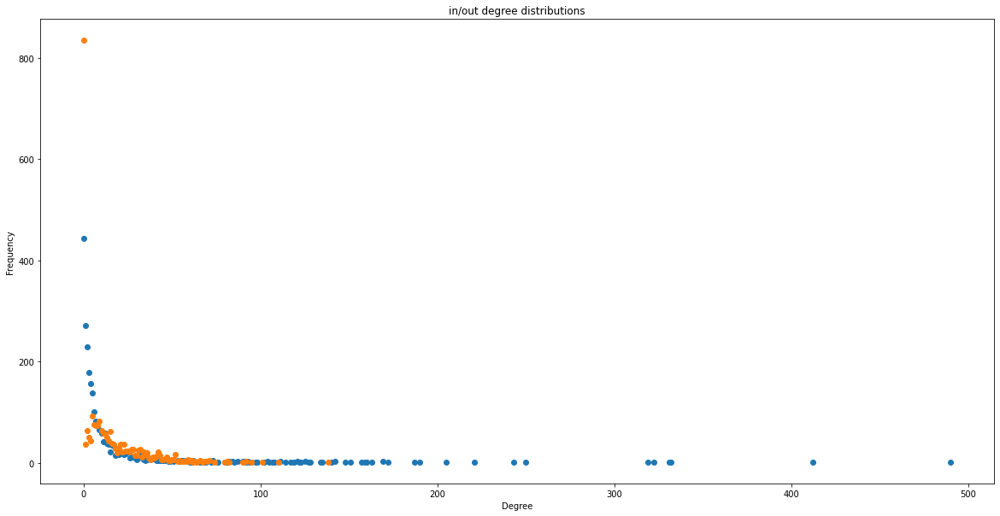

In [12]:
fig = plt.figure(figsize=(20, 10))
plotDegree(in_degree_sequence, label='in_degree')
plotDegree(out_degree_sequence, label='out_degree')
fig.show()

**Answer**

* From the plot, the in-degree and out-degree of most of the nodes are within 200. Additionally, compare to out-degree, in-degree has a longer tail on x coordinate which means more nodes have a larger in degree compare to out degree. 
* As mentioned above, more nodes have a larger in degree compare to out degree that resulting in the difference in the plot. the reason of this is that for famous charactors they might be cited by almost every characor within the same universe and even from other univers, so the in-degree could add up to a really large number. However, a general wiki page of a charactor can only contain certain amount of text, so the out-degree won't be too large. 

## Compare the degree distribution to a random network with the same number of nodes and probability of connection 𝑝. Comment on your results.

In [13]:
degree_sequence = sorted([d for n, d in DG.degree()], reverse=True)

def logPlot(degree_sequence):
    counter = collections.Counter(degree_sequence)
    x, y = [], []
    for key, value in counter.items():
        x.append(key)
        y.append(value)

    plt.title('Degree Distribution(Log-Log)')
    plt.xlabel("Degree")
    plt.ylabel("Frequency")
    plt.loglog(x, y, 'o')


def histPlot(degree_sequence):
    vec = [i for i in range(min(degree_sequence), max(degree_sequence) + 1)]
    hx, hy, _ = plt.hist(degree_sequence, bins=vec)
    plt.bar(hy[:-1], hx)
    plt.title('Histogram of the degree distribution')
    plt.xlabel("Degree")
    plt.ylabel("Frequency")

### Degree distribution of super heroes

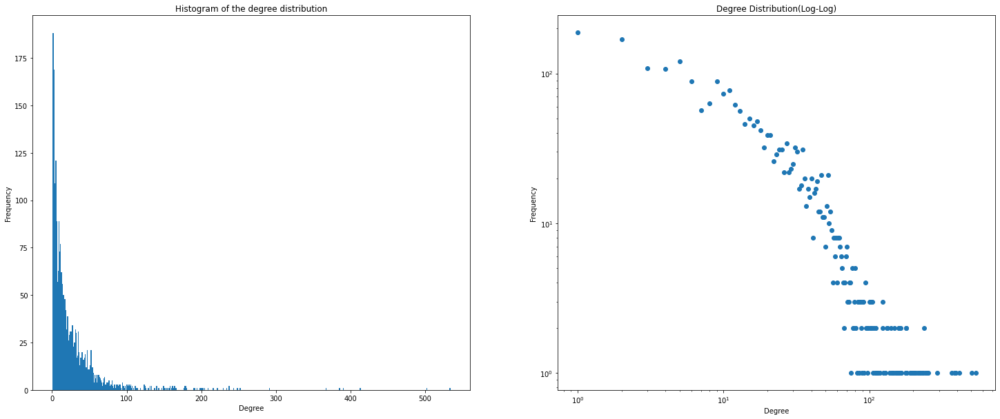

In [14]:
f = plt.figure(figsize=(25,10))
plt.subplot(1,2,1)
histPlot(degree_sequence)
plt.subplot(1,2,2)
logPlot(degree_sequence)
f.show()

The above plots shows the degree distributions of Marvel and DC charactors. On the left side, it's a histogram plot of the total distribution, on the left side, it's the degree distribution log scale.

In [15]:
N = len(DG.nodes)
k = sum(degree_sequence) / N
p = k / (N - 1)

randomG = nx.generators.random_graphs.erdos_renyi_graph(N, p)
random_degree_sequence = sorted([d for n, d in randomG.degree()], reverse=True)

### Degree distribution of corresponding random network

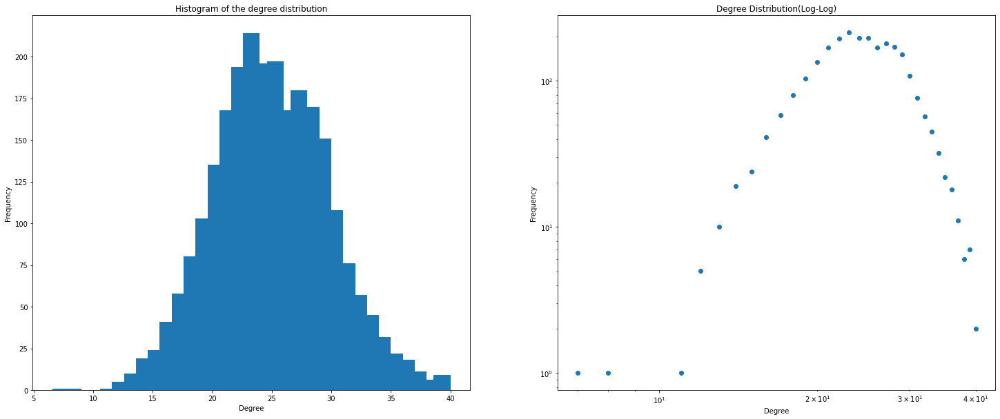

In [16]:
f = plt.figure(figsize=(25,10))
plt.subplot(1,2,1)
histPlot(random_degree_sequence)
plt.subplot(1,2,2)
logPlot(random_degree_sequence)
f.show()

**Answer**

From the plot, we can see that the super heros network are more like a Scale-free network rather than a random network.

In the histogram degree plot of super heros, the values are gathered within 50, while in the histogram of random network, the degree distribution forms a clear uniform distribution.

## Exercise 1b: Visualization

## Create a nice visualization of the total network.

   * Color nodes according to universe
   * Scale node-size according to degree
   * Whatever else you feel like.
   * If you can get it to work, get node positions based on the Force Atlas 2 algorithm


In [17]:
largest_cc = max(nx.algorithms.components.weakly_connected_components(DG), key=len)

In [18]:
def createSubGraph(G, largest_wcc):
    # Create a subgraph SG based on a (possibly multigraph) G
    SG = G.__class__()
    SG.add_nodes_from((n, G.nodes[n]) for n in largest_wcc)
    if SG.is_multigraph():
        SG.add_edges_from((n, nbr, key, d)
            for n, nbrs in G.adj.items() if n in largest_wcc
            for nbr, keydict in nbrs.items() if nbr in largest_wcc
            for key, d in keydict.items())
    else:
        SG.add_edges_from((n, nbr, d)
            for n, nbrs in G.adj.items() if n in largest_wcc
            for nbr, d in nbrs.items() if nbr in largest_wcc)
    SG.graph.update(G.graph)
    return SG

In [19]:
subDG = createSubGraph(DG, largest_cc)

In [20]:
G = subDG.to_undirected()

In [21]:
colorParm = []
node_sizes = []
degree_dict = {n: d for n, d in G.degree()}
for node in G.nodes():
    if G.nodes[node]['universe'] == "DC":
        colorParm.append("#000000")
    else:
        colorParm.append("#ff0000")
    node_sizes.append(degree_dict[node])

In [22]:
forceatlas2 = ForceAtlas2(# Behavior alternatives
                          outboundAttractionDistribution=False,  # Dissuade hubs
                          edgeWeightInfluence=0.5,
                          # Performance
                          jitterTolerance=0.2, # Tolerance
                          barnesHutOptimize=True,
                          barnesHutTheta=0.6,
                          # Tuning
                          scalingRatio=5.0,
                          strongGravityMode=True,
                          gravity=1,
                          # Log
                          verbose=True)

new_node_sizes = [x * 0.1 for x in node_sizes]
positions = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=1000)

100%|██████████| 1000/1000 [01:18<00:00, 12.82it/s]BarnesHut Approximation  took  16.67  seconds
Repulsion forces  took  58.09  seconds
Gravitational forces  took  0.04  seconds
Attraction forces  took  1.44  seconds
AdjustSpeedAndApplyForces step  took  0.66  seconds



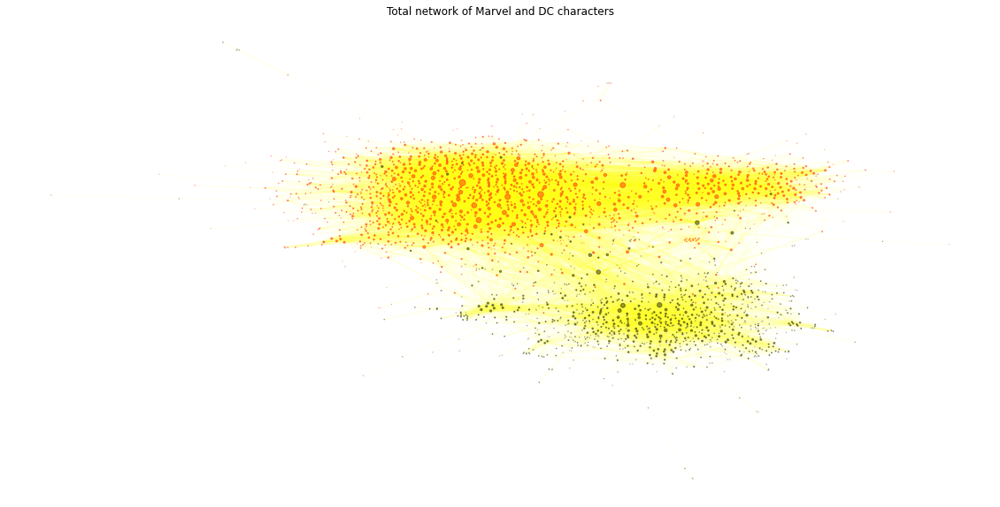

In [23]:
fig = plt.figure(figsize=(20, 10))
nx.draw_networkx_nodes(G, positions, node_size=new_node_sizes, node_color=colorParm, alpha=0.4)
nx.draw_networkx_edges(G, positions, edge_color="yellow", alpha=0.05)
plt.title("Total network of Marvel and DC characters")
plt.axis('off')
fig.show()

The above plot shows the total network structure of Marvel and DC charactors base on the wiki page citation. The degree of the charactor decides the size of the node, the larger the overall degree(in-degree plus out-degree) the larger the node size. The color of the node show which universe it belongs to, black nodes indicate that they are in the DC universe, the red ones are in Marvel universe.

# Exercise 2: Create your own version of the TF-TR word-clouds (from lecture 7). For this exercise we assume you know how to download and clean text from the wiki-pages.

Here's what you need to do:

* That's it, really. The title says it all. Create your own version of the TF-TR word-clouds. Explain your process and comment on your results.

## Tokenize each document in the universes and create two lists that contains all the tokens

In [24]:
DcList, MarvelList = [], []

for name in dcs:
    name = str(name)
    try:
        with open('./data/clean_DC/' + name, 'r') as f:
            text = f.read()
            tokens = word_tokenize(text)
            tmp = [word.lower() for word in tokens if word.isalpha()]
            DcList.extend(tmp)
    except FileNotFoundError as e:
        pass

    
for name in marvels:
    name = str(name)
    try:
        with open('./data/clean_Marvel/' + name, 'r') as f:
            text = f.read()
            tokens = word_tokenize(text)
            tmp = [word.lower() for word in tokens if word.isalpha()]
            MarvelList.extend(tmp)
    except FileNotFoundError as e:
        pass

## Create two dictionary using the token from previous step as keys and the count of occurance as values

In [25]:
marvelDict, dcDict = collections.Counter(MarvelList), collections.Counter(DcList)

## Using the count of occurance and the formula provided in the lecture notebook to calculate the TF, TR term

In [26]:
def getTF(word, universe):
    if universe == 'Marvel':
        return marvelDict[word] if word in marvelDict else 0
    else:
        return dcDict[word] if word in dcDict else 0

def getWeight(word, universe):
    if universe == "Marvel":
        return getTF(word, "Marvel") * (getTF(word, "Marvel") / (getTF(word, "Dc") + 5))
    else:
        return getTF(word, "Dc") * (getTF(word, "Dc") / (getTF(word, "Marvel") + 5))

In [27]:
marvelTFTR = sorted([(word, getWeight(word, 'Marvel')) for word in marvelDict.keys()], key=lambda x: x[1], reverse=True)
dcTFTR = sorted([(word, getWeight(word, 'DC')) for word in dcDict.keys()], key=lambda x: x[1], reverse=True)

## Build the text from the TF TR result and plot the word cloud

In [28]:
def getLongText(lst):
    text = ""
    for key, val in lst:
        text += (key + " ") * math.ceil(val)
    return text

def plotWordCloud(text):
    fig = plt.figure(figsize=(20, 10))
    wordcloud = WordCloud(collocations=False, max_words=100).generate(text)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    fig.show()

#### Word Cloud for Marvel

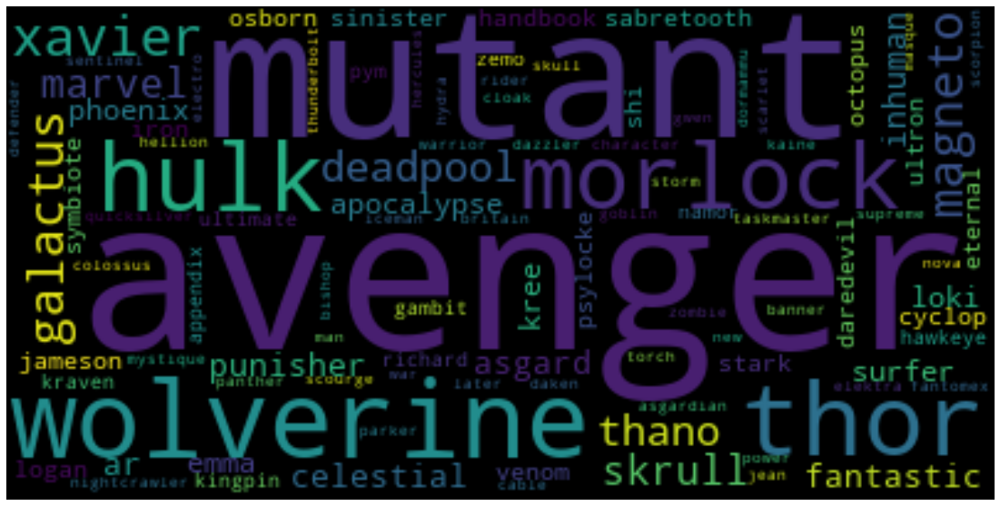

In [29]:
plotWordCloud(getLongText(marvelTFTR))

#### Word Cloud for DC

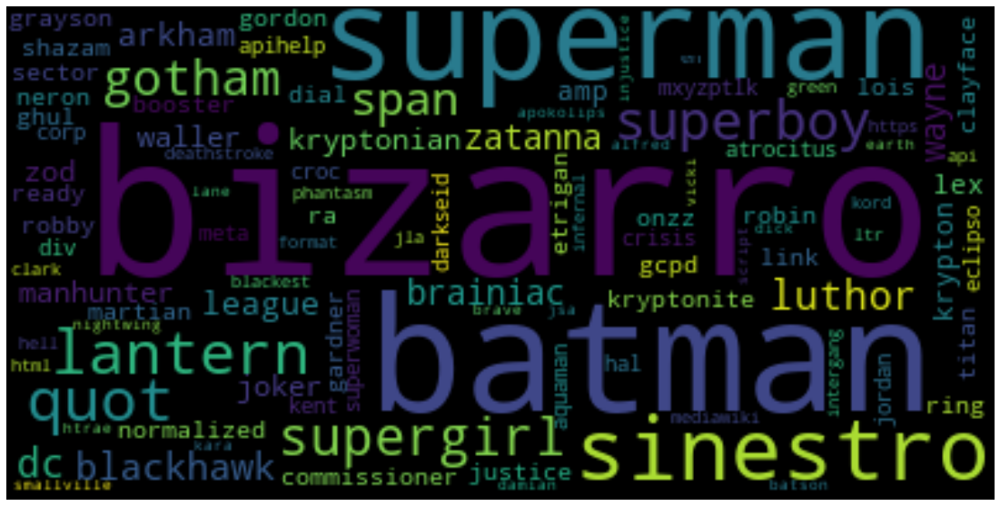

In [30]:
plotWordCloud(getLongText(dcTFTR))

**Answer**

The size of the words in the plot represents the importance of the word. Base on the plot, the most important or most mentioned word in Marvel univese is avenger and bizarro in DC universe. Several famous names are also shown up there like Superman, batman, thor, hulk and so on.

# Exercise 3: Find communities and create associated TF-IDF word clouds (from lecture 7 and 8). In this exercise, we assume that you have been able to find communities in your network. It's OK to only work on a single universe in this one.

*We are going to focus on the Marvel Universe for this exercise.*

# Explain briefly how you chose to identify the communities: Which algorithm did you use, how does it work?

**Answer**

The Louvain algorithm works by first optimizing the modularity and whereafter communities are aggregated based on their inter-community links. The modularity is optimized by first creating a number of random communities. Hereafter nodes are removed from and inserted into a different community until no significant increase in modularity is seen. The communities are aggregated by creating so-called giant nodes, where each community is a node. The modularity is then optimized again with links from the inside represented as self-loop and links from other communities are represented as weighted links.

In [31]:
def readfiles(files, graph):
    content = {}
    for filename in files:
        with open(filename) as f:
            extensions = (".txt",)
            if filename.endswith(extensions):
                filename = filename[:-4]

            name = os.path.basename(filename)
            content[name] = f.read()
    
    return content

In [32]:
marvel_subgraph = G.subgraph([n for n, nd in G.nodes.data() if nd["universe"] == "Marvel"])

In [33]:
marvel_files = glob.glob("./data/other_clean_Marvel/*")
marvel_name_to_text = readfiles(marvel_files, marvel_subgraph)

In [34]:
def communities(graph):
    partition = community.best_partition(graph)
    d = collections.defaultdict(list)
    # the community.best_partition function maps nodes to a community number, below we map 
    for com in set(partition.values()):
        for nodes in partition.keys():
            if partition[nodes] == com:
                d[com].append(nodes)
    
    return list(d.values())

marvel_communities = communities(marvel_subgraph)

## How many communities did you find in total?

**Answer**

Check the code output below.

In [35]:
print(f"The number of communities in the marvel universe: {len(marvel_communities)}")

The number of communities in the marvel universe: 14


## Plot the distribution of community sizes.

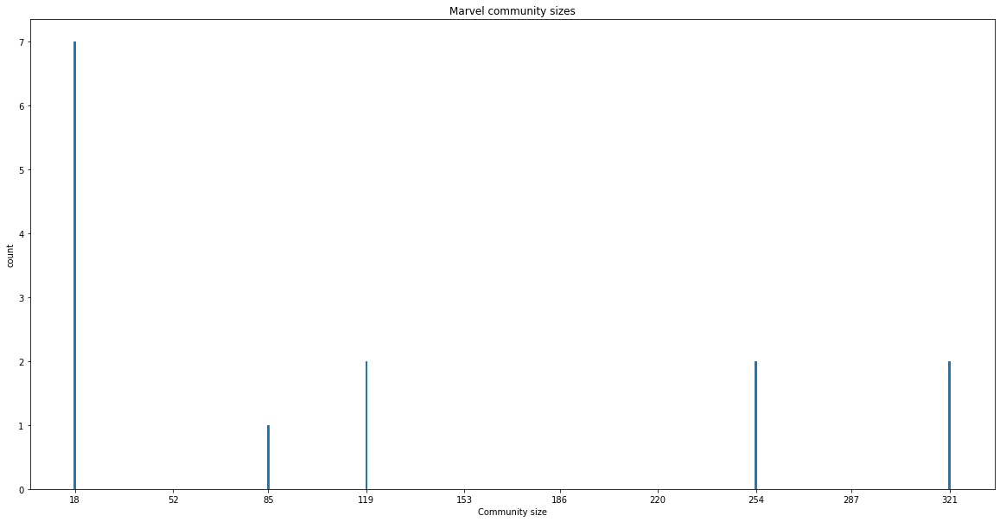

In [36]:
hist, bin_edges = np.histogram(list(len(com) for com in marvel_communities))
center = ((bin_edges[:-1] + bin_edges[1:]) / 2).round()
fig = plt.figure(figsize=(20, 10))
plt.bar(center, hist)
plt.title("Marvel community sizes")
plt.ylabel("count")
plt.xlabel("Community size")
plt.xticks(center)
fig.show()

In the above plot, the Marvel community sizes are shown. It can be observed that there are many small communities and a few very large communities.

## For the 5-10 largest communities, create TF-IDF based rankings of words in each community. There are many ways to calculate TF-IDF, explain how you've done it and motivate your choices.

In [37]:
# the top 10 communities are sorted so the largest are the first in the list.
top_10_communities = sorted(marvel_communities, key=len, reverse=True)[:10]

In [38]:
def bag_of_words(document):
    """bag_of_words returns a list of tokens of the document."""
    tokenizer = nltk.RegexpTokenizer(r"\w+(?:-\w+)*")
    tokens = tokenizer.tokenize(document)
    words = [w.lower() for w in tokens if w.isalpha()]
    
    wnl = nltk.WordNetLemmatizer()
    lemma = [wnl.lemmatize(w) for w in words]

    return lemma


def number_of_words(bag_of_words, unique_words):
    """number_of_words return a dict where the key is a word in the bag_of_words and value is the number of times it appears.

    The unique_words is all unique words in the corpus.
    """
    num_words = dict.fromkeys(unique_words, 0)
    for word in bag_of_words:
        num_words[word] += 1
    
    return collections.Counter(num_words)


def compute_TF(number_of_words, bag_of_words):
    """compute_TF returns the computed Term Frequency weight as a dict with words as keys and the weight as values."""
    tf_dict = collections.Counter()
    bag_of_words_count = len(bag_of_words)
    for word, count in number_of_words.items():
        tf_dict[word] = count # / float(bag_of_words_count)  # without / float this function is the same as number_of_words = raw count
    return tf_dict


def compute_IDF(documents):
    """compute_IDF returns the computed Inverse Document Frequency weight as a dict with words as keys and the weight as values.
    
    Its weighting scheme: inverse document frequency log(N/nt)
    """
    N = len(documents)
    
    idf_dict = collections.Counter()
    for document in documents:
        for word, val in document.items():
            if val > 0:
                idf_dict[word] += 1
    
    for word, val in idf_dict.items():
        idf_dict[word] = math.log(N / float(val))
    
    return idf_dict


def compute_TFIDF(tfs, idfs):
    """compute_TFIDF returns the computer Term Frequency - Inverse Document Frequency weight as a dict of words as keys and weight as values."""
    tf_idf = collections.Counter()
    for word, val in tfs.items():
        tf_idf[word] = val * idfs[word]
    return tf_idf

In [39]:
# list of bags - one document = one bag. Each community is one document.
list_bag_of_words = []
for com in top_10_communities:
    document = " ".join(marvel_name_to_text.get(node, "") for node in com)
    list_bag_of_words.append(bag_of_words(document))


# get all the unique words across all documents.
unique_words = {word for bag in list_bag_of_words for word in bag}

In [40]:
tfs = []
documents = []
for bag in list_bag_of_words:
    n = number_of_words(bag, unique_words)
    documents.append(n)
    tfs.append(compute_TF(n, bag))

In [41]:
# we calculate the idfs for all the documents in our corpus.
idfs = compute_IDF(documents)

In [42]:
tfidfs = []
for tf in tfs:
    tfidfs.append(compute_TFIDF(tf, idfs))

**Answer**

In calculating the TF-IDF we have used "raw count" as our weighting scheme for TF and "Inverse Document Frequency" weighting scheme for IDF.

Wordclouds uses the frequency of words to calculate how the wordcloud should look like. Therefore, if the word "superman" occurs five times more frequent than "batman" in the text then the word "superman" would be bigger in the wordcloud.

This is the reason we uses raw count to get the frequency of the word in the document.

The IDF is then used to scale down the frequency of the words and remove completely "stopwords" as they will appear in all documents.

If we had used the "Inverse Document Frequency Smooth" weighting scheme then "stopwords" would not be removed and would appear in our wordclouds.

## Create a word-cloud displaying the most important words in each community (according to TF-IDF). Comment on your results (do they make sense according to what you know about the superhero characters in those communities?)

In [43]:
wordcloud = WordCloud(
    max_words=100,
    collocations=False,
)

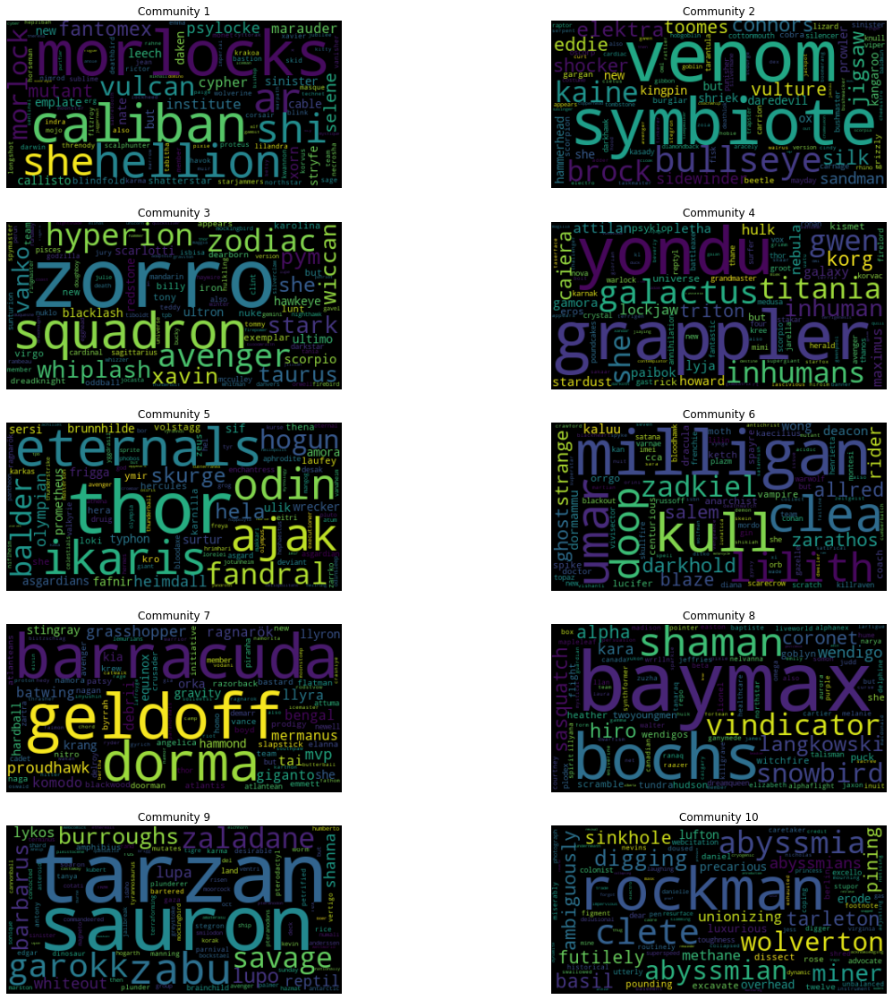

In [44]:
fig, axs = plt.subplots(nrows=(len(tfidfs)//2), ncols=2, figsize=(20,20))
for i, tfidf in enumerate(tfidfs):
    if i == 0:
        row = i
    elif i % 2 == 0:
        row += 1

    wordcloud.generate_from_frequencies(tfidf)
    axs[row, i%2].set_title(f"Community {i+1}")
    axs[row, i%2].imshow(wordcloud, interpolation="bilinear")
    axs[row, i%2].axis("off")


fig.show()

**Answer**

As the wordclouds depend on our communities generated using Louvain's algorithm, they vary a bit with each run of the code. However, with our knowledge of the Marvel universe, we can clearly see that some specific communites are generated almost every time the code is run. For example, there is a wordcloud with characters such as mutant, caliban, morlock, xavier and other x-men, clearly a part of an x-men community. We also see communities such as the asgaardian characters thor, odin, fandral and loki, and Guardians of the Galaxy with words such as thanos, yondu and gamora.

# Exercise 4: Analyze the sentiment of the communities (lecture 8). Here, we assume that you've successfully identified communities. Unlike above - we work all communities. It's still OK to work with data from a single universe. More tips & tricks can be found, if you take a look at Lecture 8's exercises.

*We are going to focus on the Marvel Universe for this exercise.*

## We name each community by its three most connected characters.

In [45]:
community_names = [", ".join(sorted([node for node in com], key=lambda x: G.degree(x), reverse=True)[:3]) for com in top_10_communities]

In [46]:
display(community_names)

['Wolverine, Scarlet Witch, Deadpool',
 'Spider-Man, She-Hulk, Daredevil',
 'Captain America, Iron Man, Hawkeye',
 'Hulk, Doctor Doom, Thing',
 'Thor, Hercules, Loki',
 'Doctor Strange, Ghost Rider, Vertigo',
 'Firestar, Namor the Sub-Mariner, Hardball',
 'Sasquatch, Wendigo, Puck',
 'Sauron, Ka-Zar, Shanna the She-Devil',
 'Rockman, Phantom Reporter, Blue Blade']

The above code output shows the community names.

## Calculate and store sentiment for every single page. 

In [47]:
# First download the dataset with happiness average

url = "https://ndownloader.figstatic.com/files/360592"
words_of_happiness = pd.read_csv(url, delimiter="\t", skiprows=3)

The above dataset comes from this paper: [Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter][1]

 [1]: https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752#s4

In [48]:
def compute_average_sentiment(tokens):
    """compute_average_sentiment returns the average sentiment value of the tokens.
    
    Each token in tokens must be in lowercase.
    """
    sentiment = 0.0
    if not len(tokens):
        return sentiment

    avg = np.nan_to_num(words_of_happiness[words_of_happiness["word"].isin(tokens)]["happiness_average"].mean())
    return avg

In [49]:
# calculate the average sentiment values for every marvel wikipage.
marvel_sentiment_values = {}
for name, val in marvel_name_to_text.items():
    marvel_sentiment_values[name] = compute_average_sentiment(bag_of_words(val))

## Average the average sentiment of the nodes in each community to find a community level sentiment.

In [50]:
# calculate the average of the average sentiment values
community_average = {}
for i, com in enumerate(top_10_communities):
        community_average[community_names[i]] = np.mean([marvel_sentiment_values.get(node, 0.0) for node in com])

In [51]:
display(community_average)

{'Wolverine, Scarlet Witch, Deadpool': 4.497555993754066,
 'Spider-Man, She-Hulk, Daredevil': 3.657405252126055,
 'Captain America, Iron Man, Hawkeye': 3.0054135889746445,
 'Hulk, Doctor Doom, Thing': 3.6021016726864743,
 'Thor, Hercules, Loki': 4.496746183476368,
 'Doctor Strange, Ghost Rider, Vertigo': 4.0330481027305805,
 'Firestar, Namor the Sub-Mariner, Hardball': 4.208226890009552,
 'Sasquatch, Wendigo, Puck': 4.0169637540209955,
 'Sauron, Ka-Zar, Shanna the She-Devil': 4.4768076331463424,
 'Rockman, Phantom Reporter, Blue Blade': 0.7811195826645271}

## Create a histogram of all character's associated page-sentiments.

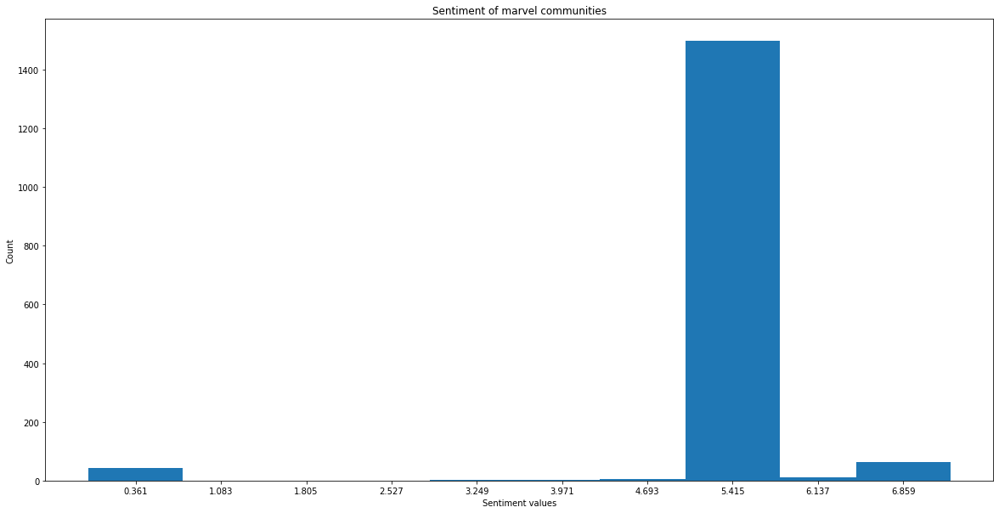

In [52]:
hist, bin_edges = np.histogram(list(marvel_sentiment_values.values()))
center = (bin_edges[:-1] + bin_edges[1:]) / 2
fig = plt.figure(figsize=(20, 10))
plt.bar(center, hist)
plt.title("Sentiment of marvel communities")
plt.ylabel("Count")
plt.xlabel("Sentiment values")
plt.xticks(center)
fig.show()

The above plot, shows the sentiment values of the marvel universe. It can be observed that mostly all Marvel wikipedia pages sentiment value is near 5.415.

## What are the 10 characters with happiest and saddest pages?

**Answer**

Check the code output below.

In [53]:
sorted_values = sorted([(node, value) for node, value in marvel_sentiment_values.items()], key=lambda x: x[1])

display(f"10 saddest characters: {sorted_values[:10]}")
display(f"10 happiest characters: {list(reversed(sorted_values[-10:]))}")

"10 saddest characters: [('Brynocki', 0.0), ('Cerebra', 0.0), ('Death-Stalker', 0.0), ('Deathurge', 0.0), ('Fasaud', 0.0), ('Feron', 0.0), ('Gorgilla', 0.0), ('Gorgolla', 0.0), ('Kleinstocks', 0.0), ('Numinus', 0.0)]"

"10 happiest characters: [('Lobo_Brothers', 7.22), ('Free_Spirit', 7.213333333333334), ('Wipeout', 7.08), ('Wasp', 7.08), ('Vidar', 7.08), ('Tusk', 7.08), ('Tremolo', 7.08), ('Trauma', 7.08), ('Transonic', 7.08), ('Thog', 7.08)]"

## What are the three happiest communities?

**Answer**

Check the code output below.

In [54]:
sorted_com = sorted([(com, value) for com, value in community_average.items()], key=lambda x: x[1])

In [55]:
display(f"3 happiest communities: {list(reversed(sorted_com[-3:]))}")

"3 happiest communities: [('Wolverine, Scarlet Witch, Deadpool', 4.497555993754066), ('Thor, Hercules, Loki', 4.496746183476368), ('Sauron, Ka-Zar, Shanna the She-Devil', 4.4768076331463424)]"

## what are the three saddest communities?

**Answer**

Check the code output below.

In [56]:
display(f"3 saddest communities: {sorted_com[:3]}")

"3 saddest communities: [('Rockman, Phantom Reporter, Blue Blade', 0.7811195826645271), ('Captain America, Iron Man, Hawkeye', 3.0054135889746445), ('Hulk, Doctor Doom, Thing', 3.6021016726864743)]"

## Do these results confirm what you can learn about each community by skimming the wikipedia pages?

**Answer**

Looking at the results of the three happiest and three saddest communties, the difference between the "happy" communities and the "saddest" communities are not that big, as their sentiment scores does not vary by much. This makes sense as Wikipedia is often written very objectively (also stated by Sune Lehmann [Sentiment](https://www.youtube.com/watch?v=JuYcaYYlfrI&feature=emb_logo&t=26)) with facts in mind, and therefore does not display the true sentiment of the characters.